In [1]:
# import all libraries
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

# from sklearn.cluster import DBSCAN

In [2]:
pwd

'C:\\Users\\COMPUTER SCIENCE\\Documents\\Ellahhh\\FinalYearProject-main\\Implementation'

<h2>Load the dataset</h2>

In [3]:
rawData = pd.read_excel('DataSet/geoPoll.xlsx')

In [4]:
# pip install openpyxl

In [5]:
rawData.head()

,Gender.Weights,Age Group.Weights,ADM1.Weights,Total Weights,Survey Date,Country,Gender,Age Group,Admin1,SEC,...,InformationSources: Friends/family,InformationSources: Government messages,InformationSources: Newspapers,InformationSources: Other,InformationSources: Radio,InformationSources: Social Media,InformationSources: TV,SocialMedia,MediaConsumption,StayPositive
0,0.921659,1.090933,1.034665,1.040323,2020-04-02,Kenya,Male,15-25,Machakos,B,...,False,True,False,False,False,False,False,NaN,Consuming more,Nothing
1,0.921659,0.894454,1.029298,0.848534,2020-04-02,Kenya,Male,26-35,Uasin Gishu,C1,...,False,True,False,False,False,True,True,Media outlets,Consuming more,Hope
2,0.970297,1.034483,0.800000,0.803004,2020-04-02,Nigeria,Male,15-25,Benue,A,...,False,False,False,False,False,True,False,Health organizations,Consuming more,Will go back to school soon
3,0.921659,0.894454,0.994802,0.820096,2020-04-02,Kenya,Male,26-35,Kisii,C1,...,False,True,True,False,True,True,True,Health organizations,Consuming more,the covid 19 outbreak has not been confirmed i...
4,0.921659,1.090933,0.975088,0.980420,2020-04-02,Kenya,Male,15-25,Nandi,B,...,False,False,False,False,False,True,False,Media outlets,Consuming less,talking to peaple and watching movies playing...


In [6]:
# to get the shape of the dataset
rawData.shape

(3988, 62)

In [7]:
# get information from the ReadAdultData
print('Information from the rawData\n')
rawData.info()

Information from the rawData

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3988 entries, 0 to 3987
Data columns (total 62 columns):
 #   Column                                           Non-Null Count  Dtype         
---  ------                                           --------------  -----         
 0   Gender.Weights                                   3988 non-null   float64       
 1   Age Group.Weights                                3988 non-null   float64       
 2   ADM1.Weights                                     3988 non-null   float64       
 3   Total Weights                                    3988 non-null   float64       
 4   Survey Date                                      3988 non-null   datetime64[ns]
 5   Country                                          3988 non-null   object        
 6   Gender                                           3988 non-null   object        
 7   Age Group                                        3988 non-null   object        
 8   Admin1  

<h2>To check if the dataset needs to be Preprocessed</h2>

In [8]:
# to detect if there are missing values and sum up the missing values.
rawData.isnull().sum()

Gender.Weights                         0
Age Group.Weights                      0
ADM1.Weights                           0
Total Weights                          0
Survey Date                            0
                                    ... 
InformationSources: Social Media       0
InformationSources: TV                 0
SocialMedia                         2364
MediaConsumption                       0
StayPositive                        1989
Length: 62, dtype: int64

<h2>To check for missing values</h2>

In [9]:
def missing_values_table(rawData):
        # Total missing values
        mis_rawData = rawData.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * rawData.isnull().sum() / len(rawData)
        
        # Make a table with the results
        mis_val_table = pd.concat([ mis_rawData , mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(rawData.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns
    
missingValues = missing_values_table(rawData)
print(missingValues)

Your selected dataframe has 62 columns.
There are 5 columns that have missing values.
                  Missing Values  % of Total Values
SocialMedia                 2364               59.3
StayPositive                1989               49.9
BiggestChallenge            1988               49.8
FoodLocations2              1927               48.3
BrandPurchase                808               20.3


<h3>The above code shows that there are missing values in some columns</h3>
<br>

In [10]:
# create a count column to later check for outliers
rawData['count'] = rawData.index

<h3>Check for mismatched data type</h3>

In [11]:
n = 0
colNo = 0 
while colNo < len(rawData.columns):
    print(rawData.columns[colNo])
    print("-----------------------------------------------------------------------------")
    for (rowName, data) in rawData.iterrows():
        if type(data[n]) == float:
            print(str(True) + ", This value has a data type of float: " + str(data[n]))
        elif type(data[n]) == str:
            print(str(True) + ", This value has a data type of string: " + str(data[n]))
        elif type(data[n]) == bool:
            print(str(True) + ", This value has a data type of boolean: " + str(data[n]))
        elif type(data[n]) == int:
            print(str(True) + ", This value has a data type of integer: " + str(data[n]))
        else:
            print("This value has a data type that does not exist: " + str(data[n]))
    n = n + 1
    print("------------------------------------------------------------------------------\n\n")
    colNo = colNo + 1

Gender.Weights
-----------------------------------------------------------------------------
True, This value has a data type of float: 0.9216589861751152
True, This value has a data type of float: 0.9216589861751152
True, This value has a data type of float: 0.9702970297029703
True, This value has a data type of float: 0.9216589861751152
True, This value has a data type of float: 0.9216589861751152
True, This value has a data type of float: 1.0928961748633879
True, This value has a data type of float: 0.9216589861751152
True, This value has a data type of float: 0.9216589861751152
True, This value has a data type of float: 0.9216589861751152
True, This value has a data type of float: 0.9216589861751152
True, This value has a data type of float: 0.9216589861751152
True, This value has a data type of float: 0.9216589861751152
True, This value has a data type of float: 0.9216589861751152
True, This value has a data type of float: 1.0303030303030303
True, This value has a data type of flo

True, This value has a data type of float: 1.1049723756906078
True, This value has a data type of float: 1.0717048387096775
True, This value has a data type of float: 0.9132420091324202
True, This value has a data type of float: 1.1049723756906078
True, This value has a data type of float: 1.1049723756906078
True, This value has a data type of float: 1.1049723756906078
True, This value has a data type of float: 0.9132420091324202
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 0.9702970297029703
True, This value has a data type of float: 1.1049723756906078
True, This value has a data type of float: 1.1049723756906078
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.4184397163120568
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.1049723756906078
True, This value has 

True, This value has a data type of float: 0.8421
True, This value has a data type of float: 0.6867096774193548
True, This value has a data type of float: 1.0344827586206897
True, This value has a data type of float: 1.7556756756756755
True, This value has a data type of float: 0.8869030864197531
True, This value has a data type of float: 0.8869030864197531
True, This value has a data type of float: 0.9569590643274855
True, This value has a data type of float: 0.9569590643274855
True, This value has a data type of float: 0.9569590643274855
True, This value has a data type of float: 0.8421
True, This value has a data type of float: 0.8869030864197531
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 0.9569590643274855
True, This value has a data type of float: 1.7556756756756755
True, This value has a data type of float: 0.9917557251908395
True, This value has a data type of float: 0.9569590643274855


True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0909333333333333
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.6363636363636365
True, This value has a data type of float: 0.8944537815126051
True, This value has a data type of float: 0.9917557251908395
True, This value has a data type of float: 1.7556756756756755
True, This value has a data type of float: 1.7556756756756755
True, This value has a data type of float: 0.8944537815126051
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 0.6867096774193548
True, This value has a data type of float: 0.6190476190476191
True, This value has a data type of float: 0.9917557251908395
True, This value has a data type of float: 0.9333333333333332
True, This value has a data type of float: 0.6190476190476191
True, This value has 

True, This value has a data type of float: 0.7285503889270489
True, This value has a data type of float: 1.863893654942447
True, This value has a data type of float: 1.0115436098568715
True, This value has a data type of float: 1.0292978256151206
True, This value has a data type of float: 0.7285503889270489
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0168444014160438
True, This value has a data type of float: 1.0115436098568715
True, This value has a data type of float: 1.5499555608603461
True, This value has a data type of float: 0.7285503889270489
True, This value has a data type of float: 0.3799530040541611
True, This value has a data type of float: 1.0
True, This value has a data type of float: 0.984657804235336
True, This value has a data type of float: 0.7285503889270489
True, This value has a data type of float: 1.863893654942447
True, This value has a data type of float: 1.0
True, This value has a data type of float: 0.72855038892

True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 0.8756238034331587
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.113888888888889
True, This value has a data type of float: 0.7285503889270489
True, This value has a data type of float: 0.905483870967742
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 0.7605172413793103
True, This value has a data type of float: 1.0339963662872953
True, This value has a data type of float: 0.3799530040541611
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 0.3799530040541611
True, This value has a data type of float: 1.0025
True, This value has a data type 

True, This value has a data type of float: 2.0087460069640093
True, This value has a data type of float: 0.2014806215046701
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 0.9462046058408398
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.1871130600233326
True, This value has a data type of float: 0.28077179246956546
True, This value has a data type of float: 1.1543163074363894
True, This value has a data type of float: 1.013743165361312
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 0.8606609064566287
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 0.8757181933771103
True, This value ha

This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 

True, This value has a data type of string: Mozambique
True, This value has a data type of string: Ghana
True, This value has a data type of string: Zambia
True, This value has a data type of string: Ghana
True, This value has a data type of string: Benin
True, This value has a data type of string: Benin
True, This value has a data type of string: Mozambique
True, This value has a data type of string: Mozambique
True, This value has a data type of string: Mozambique
True, This value has a data type of string: Ivory Coast (Cote D'Ivoire)
True, This value has a data type of string: Ghana
True, This value has a data type of string: South Africa
True, This value has a data type of string: Zambia
True, This value has a data type of string: Ivory Coast (Cote D'Ivoire)
True, This value has a data type of string: Nigeria
True, This value has a data type of string: Zambia
True, This value has a data type of string: Benin
True, This value has a data type of string: Benin
True, This value has a d

True, This value has a data type of string: Male
True, This value has a data type of string: Female
True, This value has a data type of string: Female
True, This value has a data type of string: Female
True, This value has a data type of string: Male
True, This value has a data type of string: Female
True, This value has a data type of string: Male
True, This value has a data type of string: Male
True, This value has a data type of string: Female
True, This value has a data type of string: Male
True, This value has a data type of string: Male
True, This value has a data type of string: Female
True, This value has a data type of string: Female
True, This value has a data type of string: Female
True, This value has a data type of string: Male
True, This value has a data type of string: Male
True, This value has a data type of string: Male
True, This value has a data type of string: Male
True, This value has a data type of string: Female
True, This value has a data type of string: Female


True, This value has a data type of string: 15-25
True, This value has a data type of string: 15-25
True, This value has a data type of string: 26-35
True, This value has a data type of string: 36+
True, This value has a data type of string: 26-35
True, This value has a data type of string: 15-25
True, This value has a data type of string: 15-25
True, This value has a data type of string: 36+
True, This value has a data type of string: 26-35
True, This value has a data type of string: 36+
True, This value has a data type of string: 26-35
True, This value has a data type of string: 26-35
True, This value has a data type of string: 36+
True, This value has a data type of string: 15-25
True, This value has a data type of string: 36+
True, This value has a data type of string: 36+
True, This value has a data type of string: 26-35
True, This value has a data type of string: 36+
True, This value has a data type of string: 26-35
True, This value has a data type of string: 26-35
True, This val

True, This value has a data type of string: Littoral
True, This value has a data type of string: Alibori
True, This value has a data type of string: Borgou
True, This value has a data type of string: Plateau
True, This value has a data type of string: Atlantique
True, This value has a data type of string: Littoral
True, This value has a data type of string: Ouémé
True, This value has a data type of string: Littoral
True, This value has a data type of string: Plateau
True, This value has a data type of string: Atlantique
True, This value has a data type of string: Cuoffo
True, This value has a data type of string: Atlantique
True, This value has a data type of string: Zou
True, This value has a data type of string: Plateau
True, This value has a data type of string: Plateau
True, This value has a data type of string: Plateau
True, This value has a data type of string: Littoral
True, This value has a data type of string: Atlantique
True, This value has a data type of string: Borgou
True,

True, This value has a data type of integer: 42
True, This value has a data type of integer: 27
True, This value has a data type of integer: 27
True, This value has a data type of integer: 37
True, This value has a data type of integer: 24
True, This value has a data type of integer: 24
True, This value has a data type of integer: 24
True, This value has a data type of integer: 29
True, This value has a data type of integer: 60
True, This value has a data type of integer: 36
True, This value has a data type of integer: 60
True, This value has a data type of integer: 35
True, This value has a data type of integer: 23
True, This value has a data type of integer: 36
True, This value has a data type of integer: 23
True, This value has a data type of integer: 25
True, This value has a data type of integer: 29
True, This value has a data type of integer: 38
True, This value has a data type of integer: 23
True, This value has a data type of integer: 56
True, This value has a data type of inte

True, This value has a data type of integer: 1991
True, This value has a data type of integer: 1980
True, This value has a data type of integer: 1998
True, This value has a data type of integer: 1990
True, This value has a data type of integer: 1997
True, This value has a data type of integer: 2000
True, This value has a data type of integer: 1991
True, This value has a data type of integer: 1993
True, This value has a data type of integer: 1996
True, This value has a data type of integer: 1990
True, This value has a data type of integer: 1997
True, This value has a data type of integer: 1956
True, This value has a data type of integer: 1985
True, This value has a data type of integer: 1992
True, This value has a data type of integer: 1996
True, This value has a data type of integer: 1985
True, This value has a data type of integer: 1994
True, This value has a data type of integer: 1995
True, This value has a data type of integer: 1998
True, This value has a data type of integer: 1990


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



True, This value has a data type of string: Yes - tested positive
True, This value has a data type of string: No
True, This value has a data type of string: Not sure
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: Not sure
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: Yes - tested negative
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: Not sure
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: Not sure
True, This value has a data type of string: No
True, This value has a data type of string: N

True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boo

True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of b

True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boole

True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type o

True, This value has a data type of string: More than 5 times
True, This value has a data type of string: More than 5 times
True, This value has a data type of string: 3-5 times
True, This value has a data type of string: 1-2 times
True, This value has a data type of string: More than 5 times
True, This value has a data type of string: More than 5 times
True, This value has a data type of string: More than 5 times
True, This value has a data type of string: 3-5 times
True, This value has a data type of string: More than 5 times
True, This value has a data type of string: More than 5 times
True, This value has a data type of string: More than 5 times
True, This value has a data type of string: More than 5 times
True, This value has a data type of string: 1-2 times
True, This value has a data type of string: More than 5 times
True, This value has a data type of string: More than 5 times
True, This value has a data type of string: 3-5 times
True, This value has a data type of string: More

True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: No
True, This value has a data type of string: Yes
True, This value has a data type of string: No
True, This value has a data type of string: Yes
True, This value has a data type of string: Y

True, This value has a data type of string: Go to hospital
True, This value has a data type of string: Go to hospital
True, This value has a data type of string: Go to hospital
True, This value has a data type of string: Go to hospital
True, This value has a data type of string: Go to doctor
True, This value has a data type of string: Go to hospital
True, This value has a data type of string: Go to hospital
True, This value has a data type of string: Stay home
True, This value has a data type of string: Stay home
True, This value has a data type of string: Go to hospital
True, This value has a data type of string: Go to doctor
True, This value has a data type of string: Stay home
True, This value has a data type of string: Not sure
True, This value has a data type of string: Go to hospital
True, This value has a data type of string: Go to doctor
True, This value has a data type of string: Stay home
True, This value has a data type of string: Stay home
True, This value has a data type o

True, This value has a data type of integer: 5
True, This value has a data type of integer: 2
True, This value has a data type of integer: 5
True, This value has a data type of integer: 1
True, This value has a data type of integer: 3
True, This value has a data type of integer: 5
True, This value has a data type of integer: 3
True, This value has a data type of integer: 1
True, This value has a data type of integer: 1
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 3
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 2
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This va

True, This value has a data type of string: No
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: No
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: No
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: No


True, This value has a data type of string: Online
True, This value has a data type of float: nan
True, This value has a data type of string: Supermarkets
True, This value has a data type of float: nan
True, This value has a data type of string: Supermarkets
True, This value has a data type of float: nan
True, This value has a data type of string: Hypermarkets
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of string: Other
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of string: Wholesalers
True, This value has a data type of float: nan
True, This value has a data type of string: Online
True, This value has a data type of string: Other
True, This value has a data type of string: Supermarkets
True, This value has a data type of float: nan
True, This value has a data type of string: 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type

True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of 

True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boole

True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of bo

True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of

True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type o

True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of bo

True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: T

True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: T

True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boole

True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of string: Media outlets
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of string: Governments
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of string: Friends/family
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of string: Governments
True, This value has a data type of float: nan
True, This value has a data type of string: Health organizations
True, This value has a data type of string: Health organizations
True, This value has a data ty

True, This value has a data type of string: No change
True, This value has a data type of string: Consuming less
True, This value has a data type of string: No change
True, This value has a data type of string: Consuming more
True, This value has a data type of string: Consuming less
True, This value has a data type of string: Consuming more
True, This value has a data type of string: Consuming more
True, This value has a data type of string: Consuming less
True, This value has a data type of string: Consuming more
True, This value has a data type of string: Consuming more
True, This value has a data type of string: Consuming less
True, This value has a data type of string: No change
True, This value has a data type of string: No change
True, This value has a data type of string: Consuming less
True, This value has a data type of string: Consuming less
True, This value has a data type of string: Consuming less
True, This value has a data type of string: No change
True, This value has a

True, This value has a data type of integer: 282
True, This value has a data type of integer: 283
True, This value has a data type of integer: 284
True, This value has a data type of integer: 285
True, This value has a data type of integer: 286
True, This value has a data type of integer: 287
True, This value has a data type of integer: 288
True, This value has a data type of integer: 289
True, This value has a data type of integer: 290
True, This value has a data type of integer: 291
True, This value has a data type of integer: 292
True, This value has a data type of integer: 293
True, This value has a data type of integer: 294
True, This value has a data type of integer: 295
True, This value has a data type of integer: 296
True, This value has a data type of integer: 297
True, This value has a data type of integer: 298
True, This value has a data type of integer: 299
True, This value has a data type of integer: 300
True, This value has a data type of integer: 301
True, This value has

<h3>The above code shows that there are no mismatched data type
<br>
<br>
Regrouped Age column and Birth year column </h3>

In [12]:
# For Age
rawData['Age'] = rawData['Age'].astype(int)
print(rawData['Age'].dtype)

int32


In [13]:
new_age = []
for i in rawData['Age']:
#     i = int(i)
#     print(type(i))
    if i >= 80:
        result = '80 - 90'
        new_age.append(result)
    elif i >= 69 and i < 79:
        result = '70 - 79'
        new_age.append(result)
    elif i >= 59 and i < 69:
        result = '60 - 69'
        new_age.append(result)
    elif i >= 49 and i < 59:
        result = '50 - 59'
        new_age.append(result)
    elif i >= 39 and i < 49:
        result = '40 - 49'
        new_age.append(result)
    elif i >= 29 and i < 39:
        result = '30 - 39'
        new_age.append(result)
    elif i >= 19 and i < 29:
        result = '20 - 29'
        new_age.append(result)
    elif i >= 9 and i < 19:
        result = '10 - 29'
        new_age.append(result)
    else:
        result = 'NaN'
        new_age.append(result)

rawData['Age'] = new_age

In [14]:
rawData['BirthYear'] = rawData['BirthYear'].astype(int)
print(rawData['BirthYear'].dtype)

int32


In [15]:
# for birthyear
new_birthYear = []
for i in rawData['BirthYear']:
#     i = int(i)
#     print(type(i))
    if i >= 1995:
        result = '1995 and above'
        new_birthYear.append(result)
    elif i >= 1984 and i < 1994:
        result = '1984 - 1994'
        new_birthYear.append(result)
    elif i >= 1974 and i < 1984:
        result = '1974 - 1984'
        new_birthYear.append(result)
    elif i >= 1964 and i < 1974:
        result = '1964 - 1974'
        new_birthYear.append(result)
    elif i >= 1954 and i < 1964:
        result = '1954 - 1964'
        new_birthYear.append(result)
    elif i >= 1944 and i < 1954:
        result = '1944 - 1954'
        new_birthYear.append(result)
    elif i >= 1934 and i < 1944:
        result = '1934 - 1944'
        new_birthYear.append(result)
    elif i >= 1924 and i < 1934:
        result = '1924 - 1934'
        new_birthYear.append(result)
    else:
        result = 'NaN'
        new_birthYear.append(result)

rawData['BirthYear'] = new_birthYear

<h3>dropped some columns</h3>

In [16]:
new_rawData = rawData.drop(['Gender.Weights', 'Age Group.Weights', 'ADM1.Weights', 'Total Weights', 'Admin1', 'BiggestChallenge', "StayPositive"], axis=1)

<br>
<h1>Visualization</h1>
<h2>Visualization for all the columns agains the first target variable (Brand Purchase)</h2>

C:\Users\COMPUTER SCIENCE\AppData\Local\Temp\ipykernel_7428\3001670601.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,5))


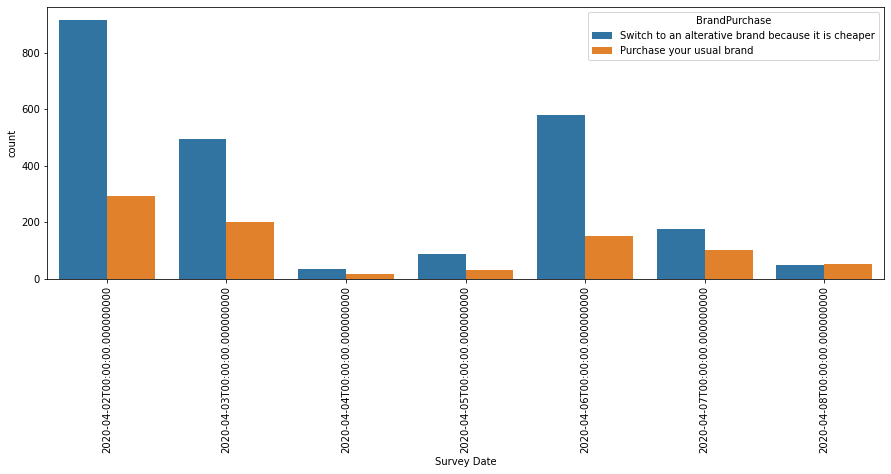

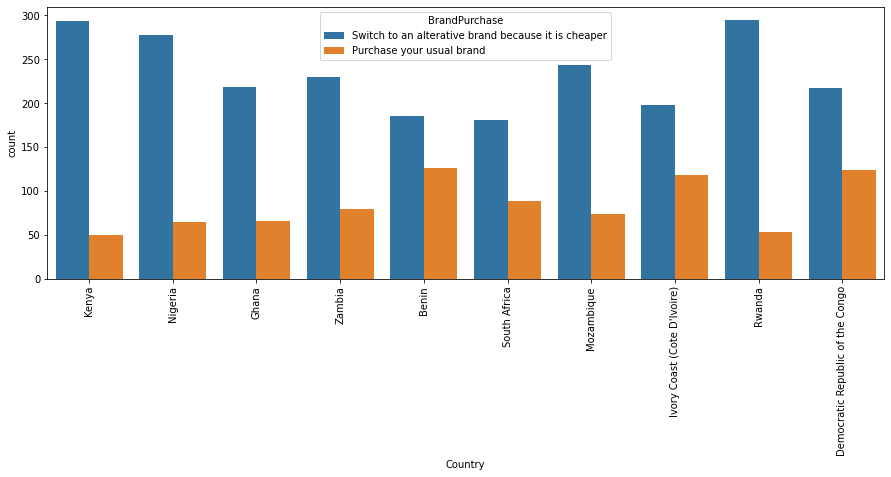

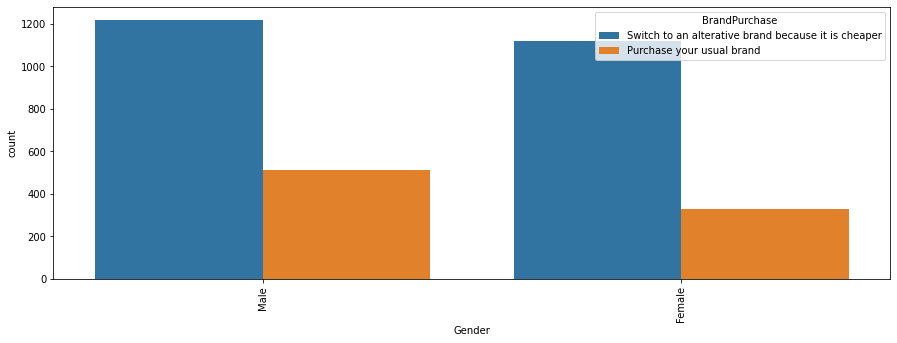

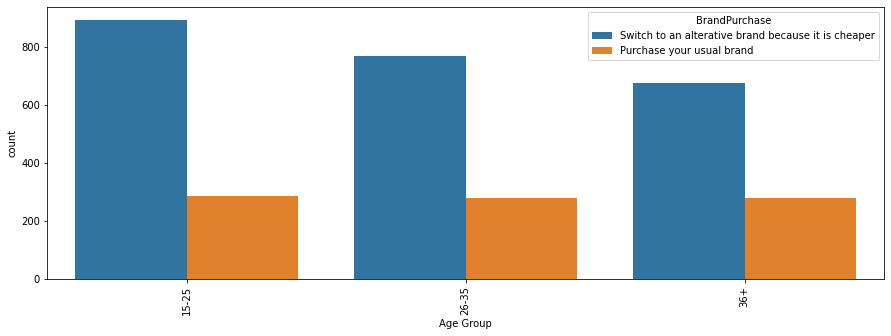

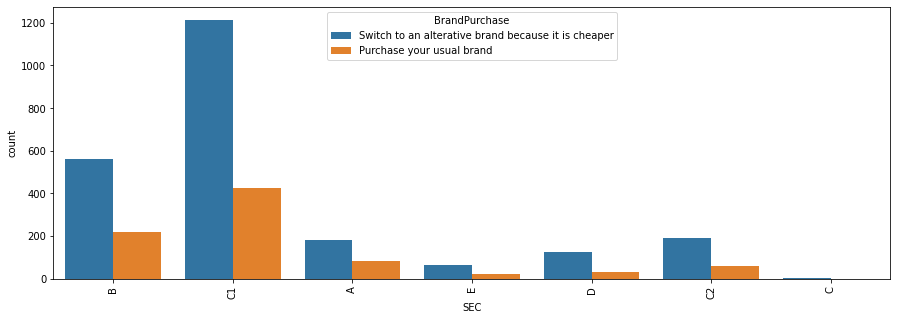

...

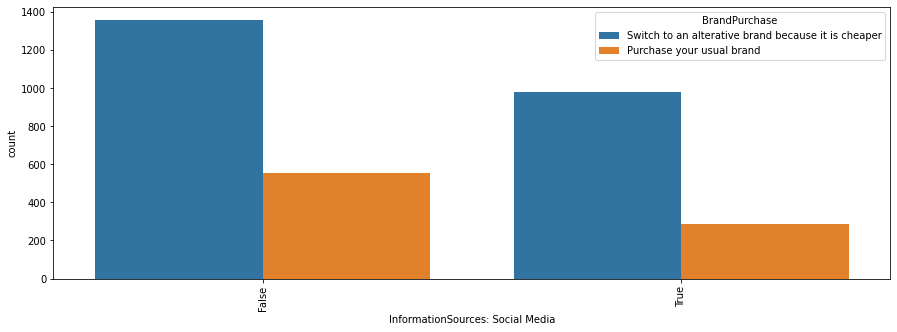

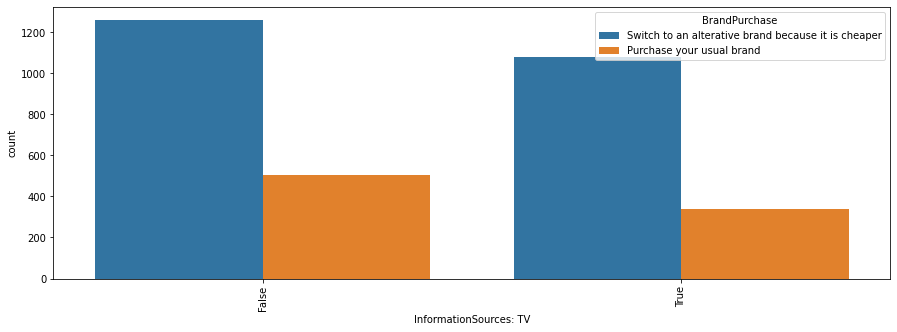

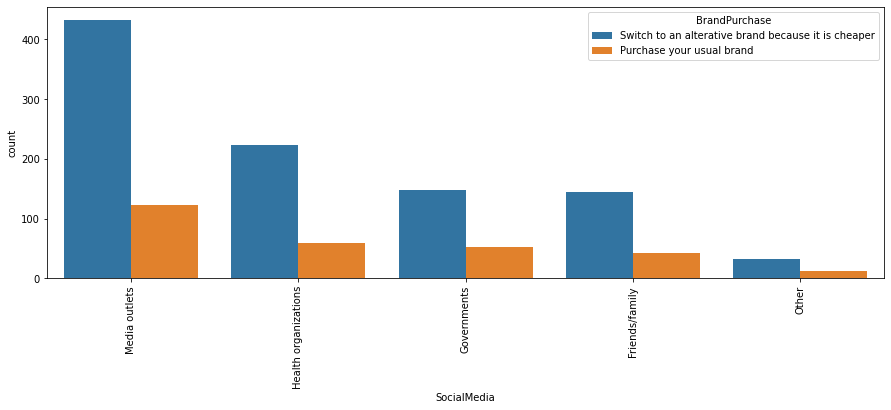

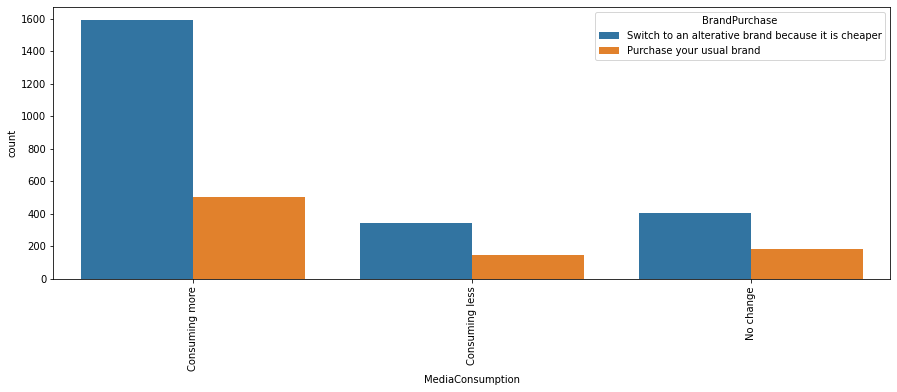

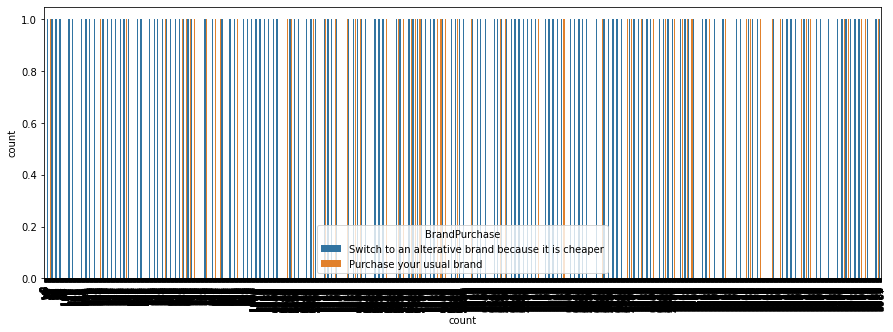

In [17]:
# loop through to visualize if possible
bp = new_rawData["BrandPurchase"]
colNo = 0
while colNo < len(new_rawData.columns):
    plt.figure(figsize=(15,5))
    plt.rcParams['figure.figsize'] = (2,2)
    sns.countplot(x=new_rawData.columns[colNo], hue= bp, data=new_rawData)
    plt.xticks(rotation=90)
    colNo = colNo + 1 

<br>
<h2>Visualization for all the columns agains the second target variable (Food Shopping)</h2>

C:\Users\COMPUTER SCIENCE\AppData\Local\Temp\ipykernel_7428\4002867920.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,5))


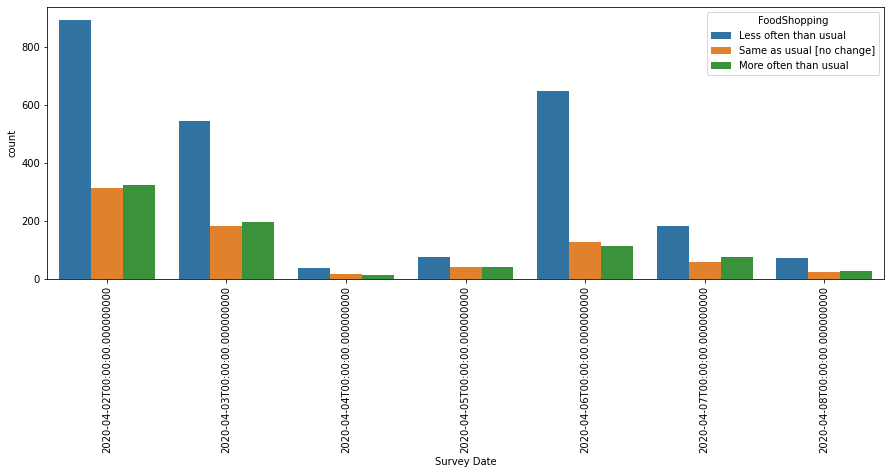

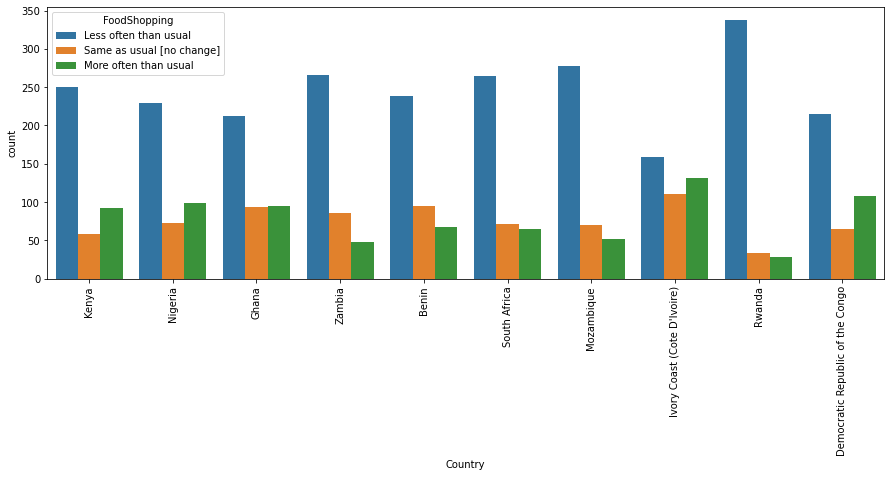

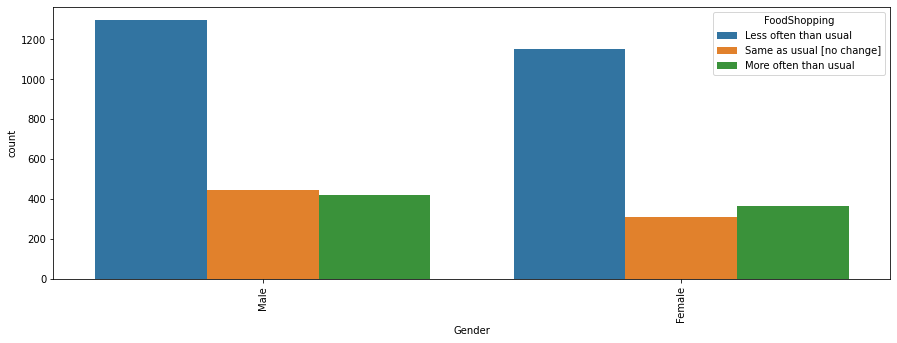

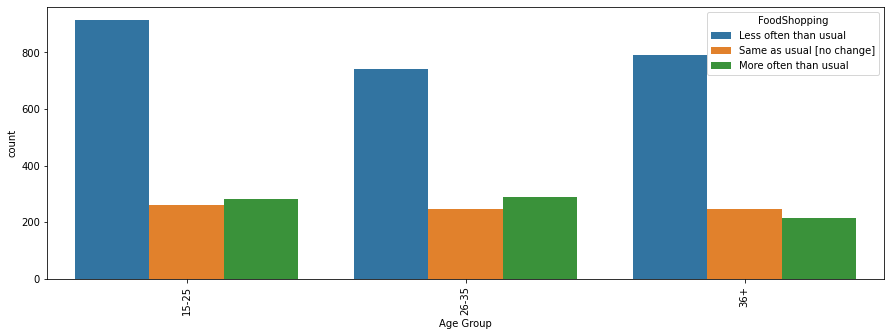

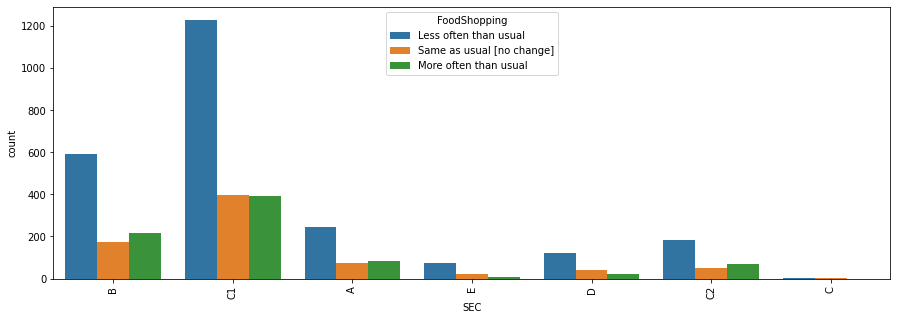

...

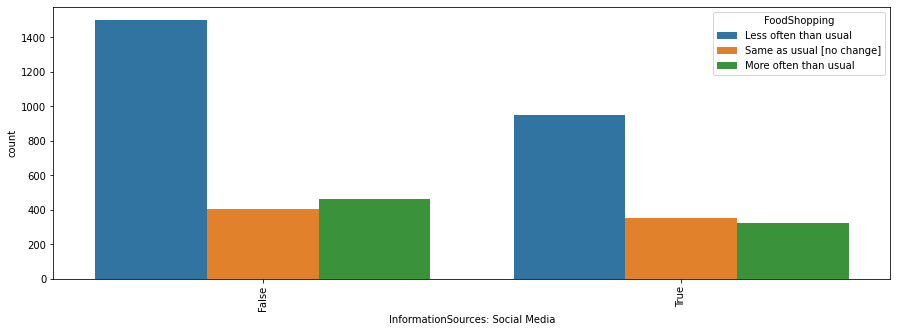

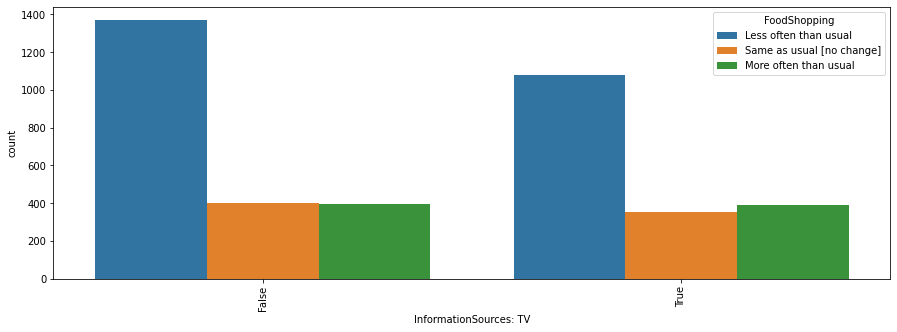

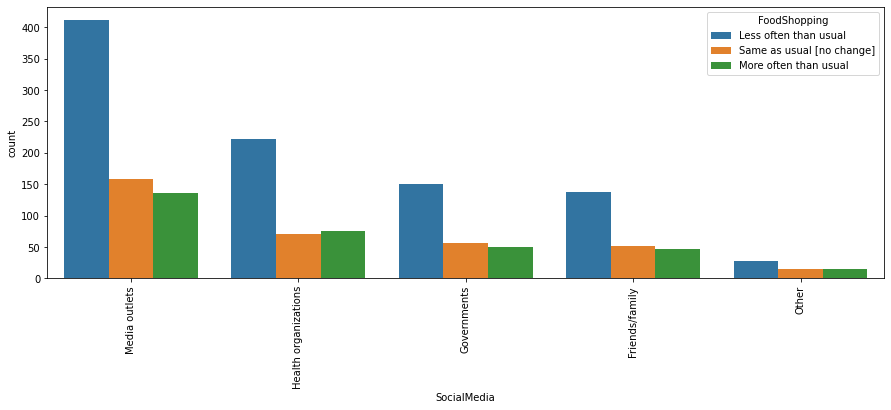

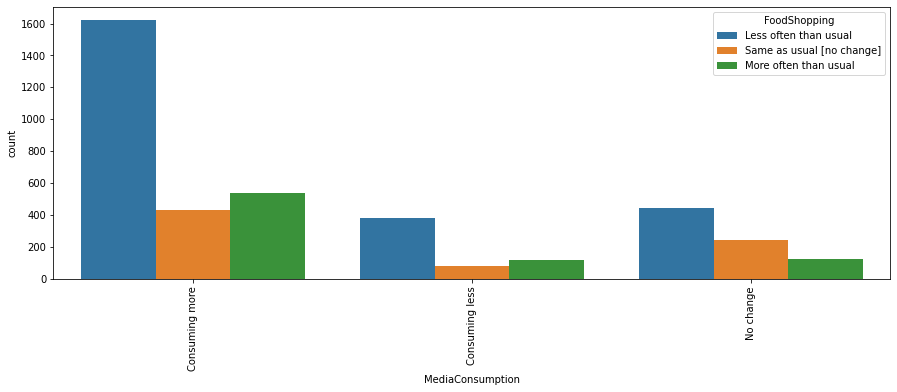

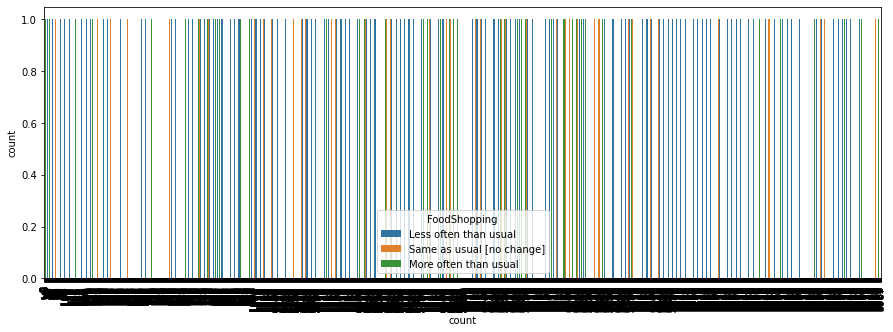

In [18]:
fs = new_rawData["FoodShopping"]
# print(bp)
colNo = 0
while colNo < len(new_rawData.columns):
    plt.figure(figsize=(15,5))
    plt.rcParams['figure.figsize'] = (2,2)
    sns.countplot(x=new_rawData.columns[colNo], hue= fs, data=new_rawData)
    plt.xticks(rotation=90)
    colNo = colNo + 1 

<br>
<h2>Visualization for all the columns agains the third target variable (Food Amount)</h2>

C:\Users\COMPUTER SCIENCE\AppData\Local\Temp\ipykernel_7428\216282589.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,5))


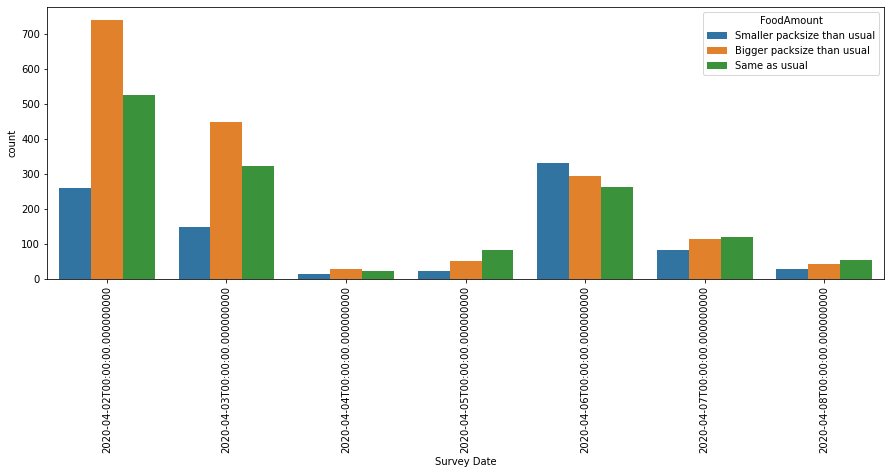

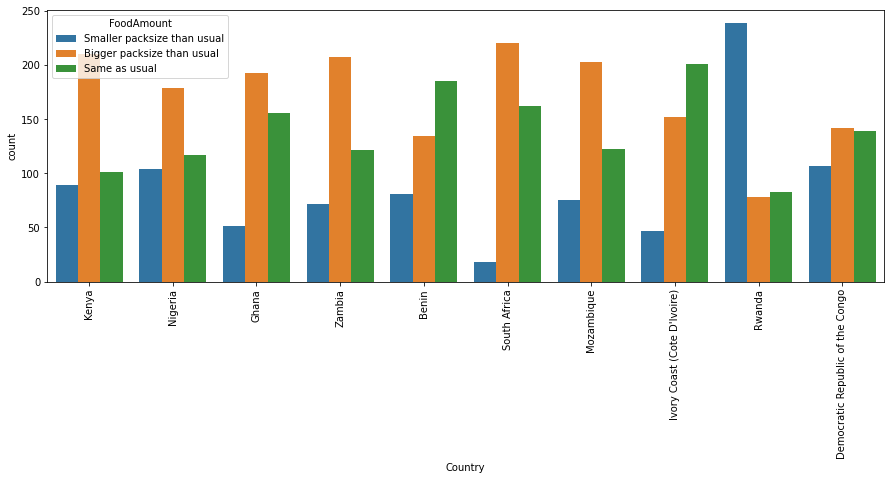

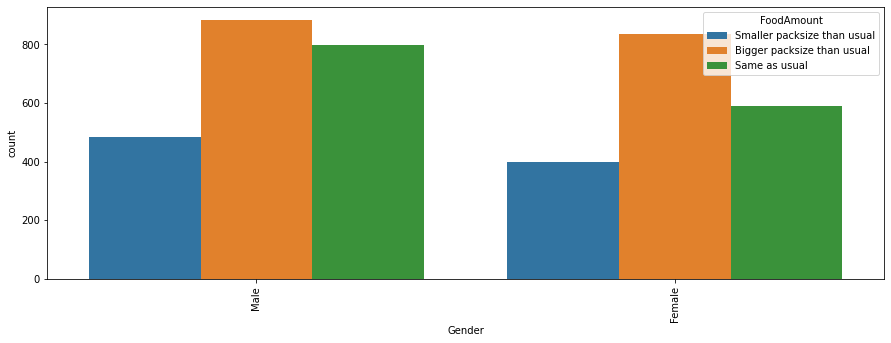

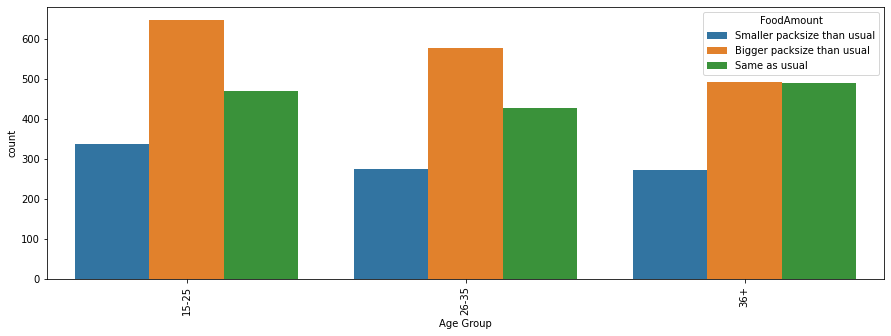

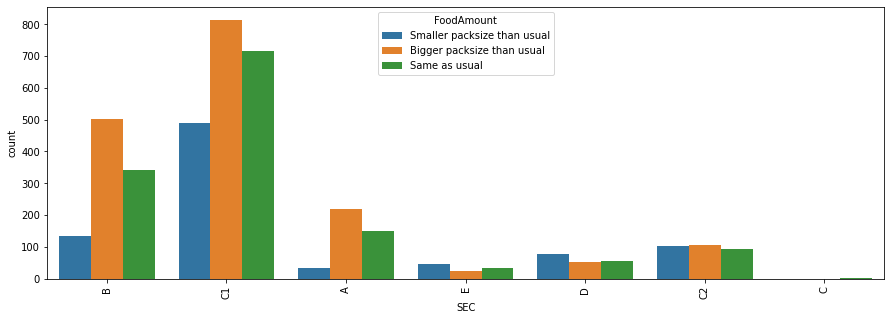

...

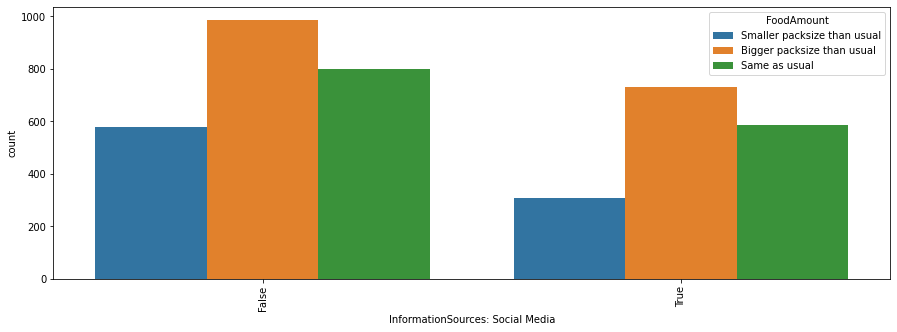

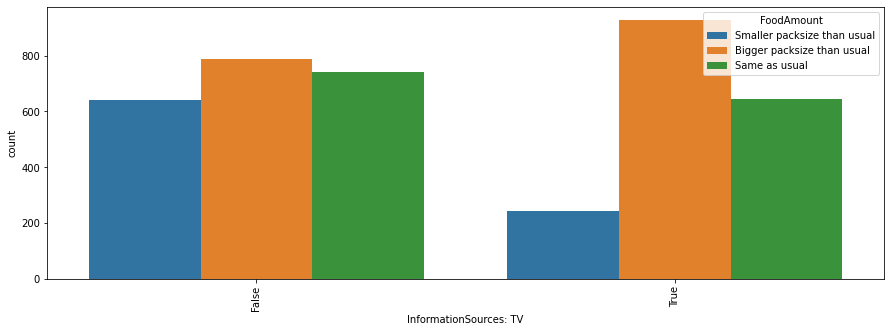

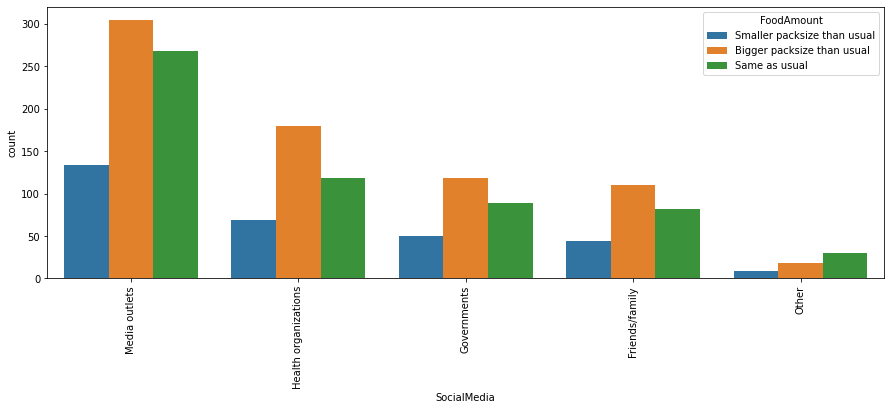

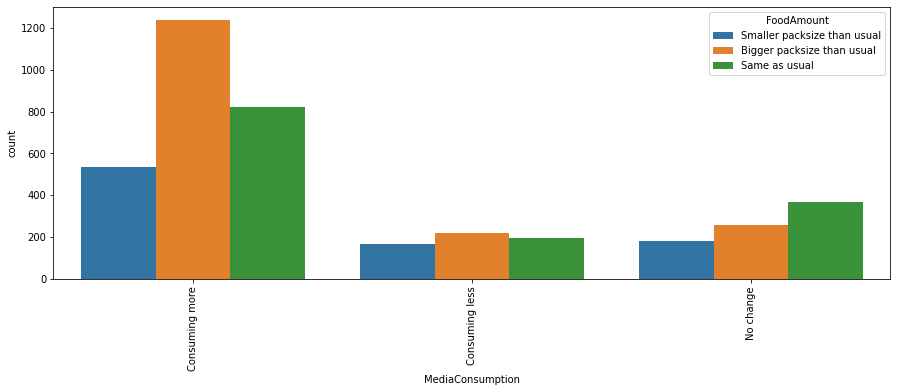

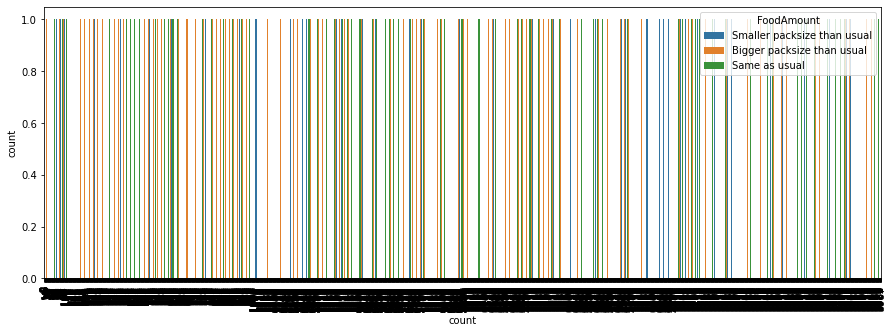

In [19]:
fa = new_rawData["FoodAmount"]
colNo = 0
while colNo < len(new_rawData.columns):
    plt.figure(figsize=(15,5))
    plt.rcParams['figure.figsize'] = (2,2)
    sns.countplot(x=new_rawData.columns[colNo], hue= fa, data=new_rawData)
    plt.xticks(rotation=90)
    colNo = colNo + 1 

<h2>Check for Outliers using Visualization (Boxplot) </h2>

C:\Users\COMPUTER SCIENCE\AppData\Local\Temp\ipykernel_7428\3543824417.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(17,1))


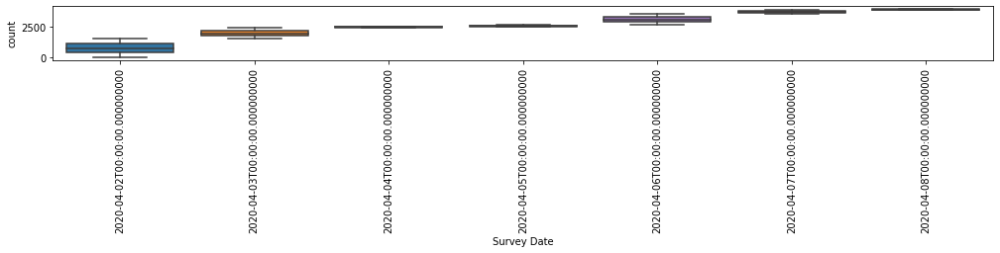

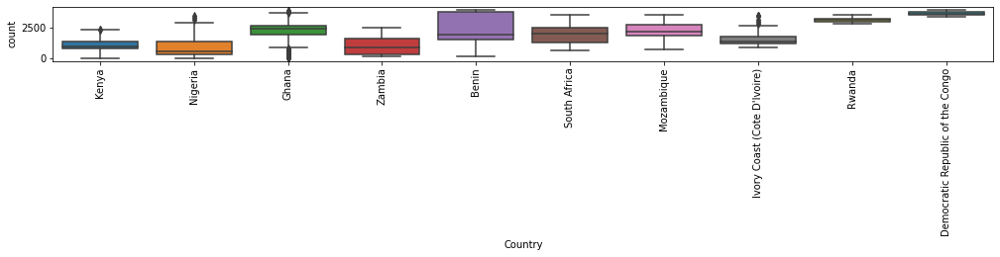

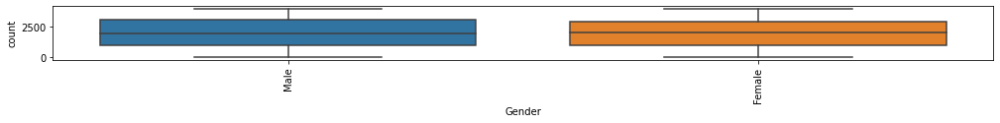

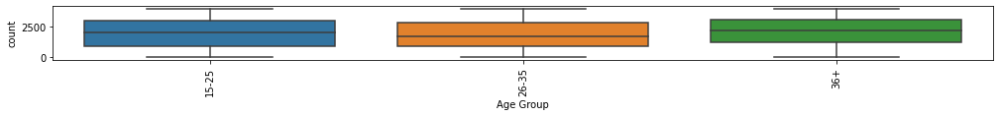

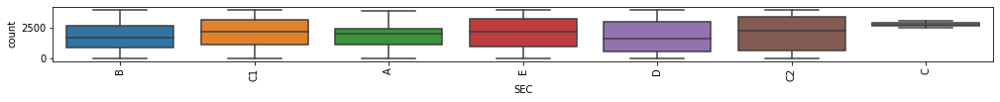

...

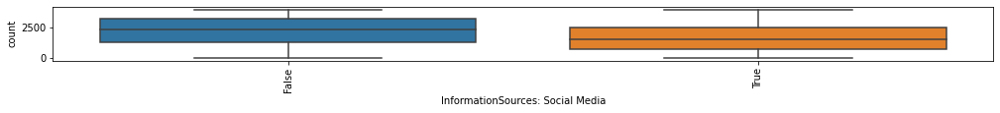

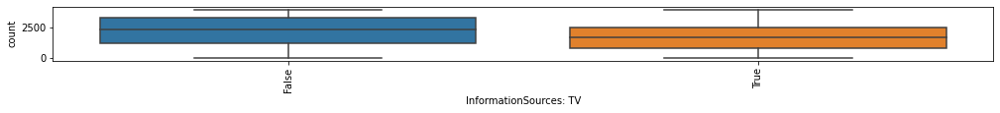

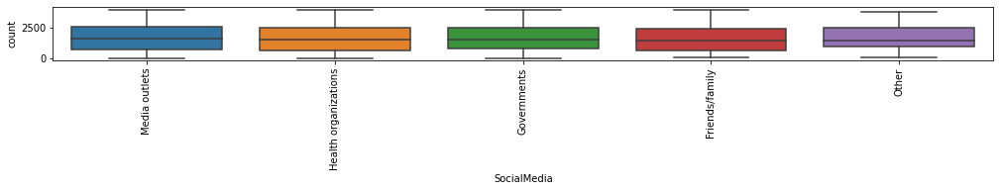

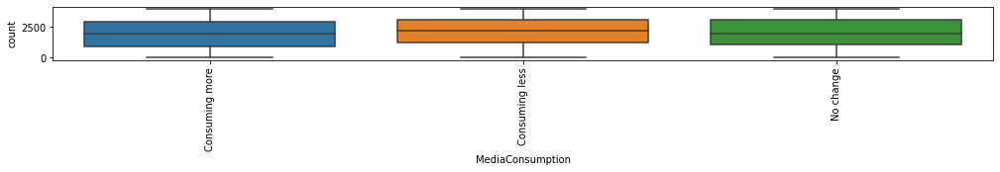

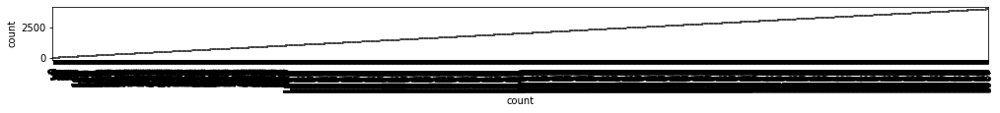

In [20]:
for column in new_rawData:
        plt.figure(figsize=(17,1))
        sns.boxplot(data=new_rawData, x=column, y=new_rawData['count'])
        plt.xticks(rotation=90)

In [21]:
#create a function to find outliers using IQR
# n = 1
# colNo = 1
# while colNo < len(new_rawData.columns):
#     print(new_rawData.columns[colNo])
#     print("-----------------------------------------------------------------------------")
#     for (new_rowName, data) in new_rawData.iterrows():
#         print(data[n])
#         q1 = int(data[n]).quantile(0.25)
#         q3 = int(data[n]).quantile(0.75)
#         IQR = q3 - q1
#         outliers = data[((data[n]<(q1-1.5*IQR)) | (data[n]>(q3+1.5*IQR)))]
#         print("number of outliers: " + str(len(outliers)))
#         print("max outlier value: " + str(outliers.max()))
#         print("min outlier value: " + str(outliers.min()))
#     n = n + 1
#     print("------------------------------------------------------------------------------\n\n")
#     colNo = colNo + 1

In [22]:
new_rawData = new_rawData.drop(labels='count', axis=1)
new_rawData.head()

,Survey Date,Country,Gender,Age Group,SEC,Age,BirthYear,Awareness,Urban/Rural,LevelConcern,...,Groups: Retailers,InformationSources: Friends/family,InformationSources: Government messages,InformationSources: Newspapers,InformationSources: Other,InformationSources: Radio,InformationSources: Social Media,InformationSources: TV,SocialMedia,MediaConsumption
0,2020-04-02,Kenya,Male,15-25,B,20 - 29,1995 and above,Yes,Rural area,5,...,False,False,True,False,False,False,False,False,NaN,Consuming more
1,2020-04-02,Kenya,Male,26-35,C1,20 - 29,1984 - 1994,Yes,Urban area,5,...,True,False,True,False,False,False,True,True,Media outlets,Consuming more
2,2020-04-02,Nigeria,Male,15-25,A,20 - 29,1995 and above,Yes,Urban area,5,...,False,False,False,False,False,False,True,False,Health organizations,Consuming more
3,2020-04-02,Kenya,Male,26-35,C1,30 - 39,1984 - 1994,Yes,Rural area,5,...,True,False,True,True,False,True,True,True,Health organizations,Consuming more
4,2020-04-02,Kenya,Male,15-25,B,20 - 29,NaN,Yes,Rural area,5,...,False,False,False,False,False,False,True,False,Media outlets,Consuming less


In [34]:
new_rawData.shape

(3988, 55)

<h3>Converted the dataset to csv</h3>

In [23]:
new_rawData.to_csv("DataSet/AfterVisualization.csv")

<h2>Preprocessing Stage</h2>
<ol>
    <li>Handling missing values</li>
    <li>Fixing Outliers</li>
    <li>Conversion from Categorical to numerical Values</li>
</ol>

<h3>Handling Missing Values</h3>

In [24]:
new_rawData1 = new_rawData.drop(["FoodLocations2"], axis=1)

<h3> Handling the last missing value column because it is our target variable </h3>
<p>We will make use of the KNNImputer function from the impute module of the sklearn. KNNImputer helps to impute missing values present <br>in the observations by finding the nearest neighbors with the Euclidean distance matrix.
</p>

In [25]:
new_rawData1["BrandPurchase"]= new_rawData1.BrandPurchase.map({"Switch to an alterative brand because it is cheaper":1, "Purchase your usual brand":0})
print(new_rawData1["BrandPurchase"])

0       1.0
1       NaN
2       NaN
3       1.0
4       1.0
       ... 
3983    1.0
3984    0.0
3985    NaN
3986    0.0
3987    0.0
Name: BrandPurchase, Length: 3988, dtype: float64


In [26]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=2)
bpMissing = imputer.fit_transform(new_rawData1[["LevelConcern", "BrandPurchase"]])

<p>I was able to make use of KNN Imputation to predict the missing values for the target column "Brand Purchase"</p>

In [27]:
new_rawData1["BrandPurchase"] = bpMissing[0:, 1:]
print(new_rawData1["BrandPurchase"])

0       1.0
1       1.0
2       1.0
3       1.0
4       1.0
       ... 
3983    1.0
3984    0.0
3985    1.0
3986    0.0
3987    0.0
Name: BrandPurchase, Length: 3988, dtype: float64


<h3> Conversion of Categorical Columns to Numerical Columns</h3>
<p>We will use the KNNImputer function from the impute module of the sklearn. KNNImputer helps to impute missing values present <br>in the observations by finding the nearest neighbors with the Euclidean distance matrix.
</p>

<h3>Conversion of Categorical Data to Numerical Data</h3>
<p>I will be making use of .get-dummies method</p>

In [29]:
CategoricalData = new_rawData1.drop(["Survey Date", "LevelConcern", "EconomicImpact", "GovernmentTrust", "BrandPurchase"], axis=1)

In [30]:
conversion = pd.get_dummies(CategoricalData)
conversion.head()

,PreventativeMeasures: Avoiding public places,PreventativeMeasures: Avoiding public transport,PreventativeMeasures: Increasing hygiene,PreventativeMeasures: Other,PreventativeMeasures: Working from home,CommercialTrust: Banks,CommercialTrust: Brands,CommercialTrust: Other,CommercialTrust: Retailers,CommercialTrust: Telecommuncations,...,NonEssentialItems_Increased,NonEssentialItems_No change,SocialMedia_Friends/family,SocialMedia_Governments,SocialMedia_Health organizations,SocialMedia_Media outlets,SocialMedia_Other,MediaConsumption_Consuming less,MediaConsumption_Consuming more,MediaConsumption_No change
0,False,False,False,False,True,True,False,False,False,False,...,0,0,0,0,0,0,0,0,1,0
1,True,False,True,False,False,True,False,False,False,True,...,0,0,0,0,0,1,0,0,1,0
2,False,False,False,False,True,True,False,False,False,False,...,0,0,0,0,1,0,0,0,1,0
3,False,False,True,False,False,False,False,True,False,False,...,0,0,0,0,1,0,0,0,1,0
4,False,False,True,False,False,True,False,False,False,False,...,0,0,0,0,0,1,0,1,0,0


In [51]:
# conversion.shape
ConvertedData = conversion.iloc[:, 26:]
print(ConvertedData)

      Country_Benin  Country_Democratic Republic of the Congo  Country_Ghana  \
0                 0                                         0              0   
1                 0                                         0              0   
2                 0                                         0              0   
3                 0                                         0              0   
4                 0                                         0              0   
...             ...                                       ...            ...   
3983              0                                         1              0   
3984              0                                         1              0   
3985              0                                         1              0   
3986              0                                         1              0   
3987              0                                         1              0   

      Country_Ivory Coast (Cote D'Ivoir

In [55]:
ConvertedData["Survey Date"] = new_rawData1["Survey Date"]
ConvertedData["LevelConcern"] = new_rawData1["LevelConcern"]
ConvertedData["EconomicImpact"] = new_rawData1["EconomicImpact"]
ConvertedData["GovernmentTrust"] = new_rawData1["GovernmentTrust"]
ConvertedData["BrandPurchase"] = new_rawData1["BrandPurchase"]

In [56]:
ConvertedData.head()

,Country_Benin,Country_Democratic Republic of the Congo,Country_Ghana,Country_Ivory Coast (Cote D'Ivoire),Country_Kenya,Country_Mozambique,Country_Nigeria,Country_Rwanda,Country_South Africa,Country_Zambia,...,SocialMedia_Media outlets,SocialMedia_Other,MediaConsumption_Consuming less,MediaConsumption_Consuming more,MediaConsumption_No change,Survey Date,LevelConcern,EconomicImpact,GovernmentTrust,BrandPurchase
0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,2020-04-02,5,5,1,1.0
1,0,0,0,0,1,0,0,0,0,0,...,1,0,0,1,0,2020-04-02,5,3,2,1.0
2,0,0,0,0,0,0,1,0,0,0,...,0,0,0,1,0,2020-04-02,5,4,4,1.0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,2020-04-02,5,5,4,1.0
4,0,0,0,0,1,0,0,0,0,0,...,1,0,1,0,0,2020-04-02,5,5,5,1.0


In [58]:
ConvertedData.to_csv("DataSet/ConvertedData.csv")

<h2>Feature Selection</h2>